In [1]:
from rdkit import Chem
from rdkit.Chem import Draw
import os

In [2]:
# https://github.com/rdkit/rdkit-tutorials/blob/master/notebooks/006_save_rdkit_mol_as_image.ipynb
# https://greglandrum.github.io/rdkit-blog/posts/2023-10-25-molsmatrixtogridimage.html
# https://github.com/rdkit/rdkit/issues/3093
# https://www.rdkit.org/docs/GettingStartedInPython.html

In [3]:
with open("test_reconstructions.txt", "r") as f:
    reconstructions = [pair.split(",") for pair in f.read().split("\n")]

/data5/jacob/anaconda3/envs/rdkit/lib/python3.8/site-packages/rdkit/Chem/Draw/IPythonConsole.py:261: UserWarning: Truncating the list of molecules to be displayed to 50. Change the maxMols value to display more.
  warnings.warn(


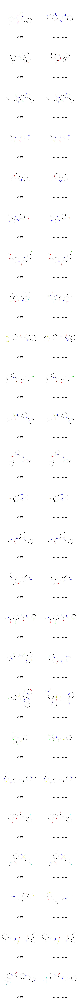

In [4]:
# os.makedirs("reconstruction_visualizations", exist_ok=True)
npairs = len(reconstructions)
opts = Draw.MolDrawOptions()
opts.legendFraction = 0.1
opts.legendFontSize = 50
img = Draw.MolsToGridImage([Chem.MolFromSmiles(smile) for smile in sum(reconstructions[:npairs], [])], 
                           molsPerRow=2, 
                           subImgSize=(1000,1000), 
                           legends=["Original", "Reconstruction"] * npairs,
                           drawOptions=opts,
                           returnPNG=False)
# img.save('reconstruction_visualizations/full_reconstructions.png') 
img

In [5]:
symbol_names = [('/', '_fs_'), ('\\', '_bs_'), ('#', '_pd_'), ('[', '_lb_'), (']', '_rb_'), ('(', '_lp_'), (')', '_rp_'), ('=', '_eq_'), ('@', '_at_'), ('+', '_pl_')]

def visualize_reconstruction(original_smile, reconstructed_smile, filename=None):
    original_mol, reconstructed_mol = Chem.MolFromSmiles(original_smile), Chem.MolFromSmiles(reconstructed_smile)
    if filename is None:
        filename = original_smile
        for sym, name in symbol_names:
            filename = filename.replace(sym, name)
    opts = Draw.MolDrawOptions()
    opts.legendFraction = 0.1
    opts.legendFontSize = 50
    img = Draw.MolsToGridImage([original_mol, reconstructed_mol],
                               molsPerRow=2,
                               subImgSize=(1000,1000),
                               legends=["Original", "Reconstruction"],
                               drawOptions=opts,
                               returnPNG=False)
    # img.save(os.path.join('reconstruction_visualizations', f'{filename}.png'))

In [6]:
visualize_reconstruction(*reconstructions[0], "recon0")

In [7]:
for i, (input_smile, recon_smile) in enumerate(reconstructions):
    visualize_reconstruction(input_smile, recon_smile, f"recon{i}")

In [8]:
with open("recommendations.txt", "r") as f:
    recommendations = [pair.split(",") for pair in f.read().split("\n")]

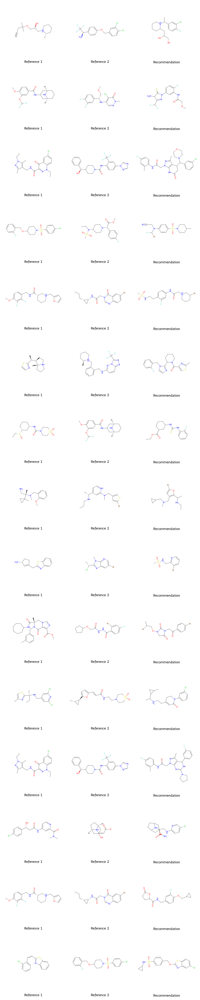

In [9]:
# os.makedirs("recommendation_visualizations", exist_ok=True)
npairs = len(recommendations)
opts = Draw.MolDrawOptions()
opts.legendFraction = 0.1
opts.legendFontSize = 50
img = Draw.MolsToGridImage([Chem.MolFromSmiles(smile) for smile in sum(recommendations[:npairs], [])], 
                           molsPerRow=3, 
                           subImgSize=(1000,1000), 
                           legends=["Reference 1", "Reference 2", "Recommendation"] * npairs,
                           drawOptions=opts,
                           returnPNG=False)
# img.save('recommendation_visualizations/full_recommendations.png') 
img

In [10]:
def visualize_recommendation(ref1_smile, ref2_smile, rec_smile, filename=None):
    ref1_mol, ref2_mol, rec_mol = Chem.MolFromSmiles(ref1_smile), Chem.MolFromSmiles(ref2_smile), Chem.MolFromSmiles(rec_smile)
    if filename is None:
        filename = ref1_smile + "--" + ref2_smile
        for sym, name in symbol_names:
            filename = filename.replace(sym, name)
    opts = Draw.MolDrawOptions()
    opts.legendFraction = 0.1
    opts.legendFontSize = 50
    img = Draw.MolsToGridImage([ref1_mol, ref2_mol, rec_mol],
                               molsPerRow=3,
                               subImgSize=(1000,1000),
                               legends=["Reference 1", "Reference 2", "Recommendation"],
                               drawOptions=opts,
                               returnPNG=False)
    filename = os.path.join('recommendation_visualizations', f'{filename}.png')
    # img.save(filename)

In [11]:
visualize_recommendation(*recommendations[0], filename='rec0')

In [12]:
for i, (ref1_smile, ref2_smile, rec_smile) in enumerate(recommendations):
    visualize_recommendation(ref1_smile, ref2_smile, rec_smile, f"rec{i}")

In [13]:
with open("e2e_recommendations.txt", "r") as f:
    recommendations = [pair.split(",") for pair in f.read().split("\n")]
    
e2e_recs = dict()
for rec in recommendations:
    userID = rec.pop(0)
    num_refs = int(rec.pop(0))
    stage2_rec = rec.pop()
    stage1_recs = rec[num_refs:]
    refs = rec[:num_refs]
    e2e_recs[userID] = dict(refs=refs, stage1_recs=stage1_recs, stage2_rec=stage2_rec)

In [14]:
dims = dict()
def visualize_e2e_recommendation(userID, ref_inds, dims):
    e2e_rec = e2e_recs[userID]
    stage1_recs = [Chem.MolFromSmiles(smile) for smile in e2e_rec['stage1_recs']]
    reference_mols = [Chem.MolFromSmiles(smile) for smile in e2e_rec['refs']]
    if ref_inds is not None:
        assert len(ref_inds) == len(stage1_recs)
    else:
        ref_inds = range(len(stage1_recs))
    reference_mols = [reference_mols[i] for i in ref_inds]
    mid_pt = len(stage1_recs) // 2
    npre_blanks = mid_pt - (len(stage1_recs) % 2 == 0)
    npost_blanks = mid_pt
    add_legend = lambda title: [''] * npre_blanks + [title] + [''] * npost_blanks
    stage2_rec = [None] * npre_blanks + [Chem.MolFromSmiles(e2e_rec['stage2_rec'])]
    legends = add_legend("References") + add_legend("Stage 1 Recommendations") + add_legend("Stage 2 Recommendation")


    opts = Draw.MolDrawOptions()
    opts.legendFraction = 0.1
    opts.legendFontSize = 50
    img = Draw.MolsToGridImage(reference_mols + stage1_recs + stage2_rec,
                                molsPerRow=len(stage1_recs),
                                subImgSize=dims,
                                legends=legends,
                                drawOptions=opts,
                                returnPNG=False)
    filename = os.path.join('e2e_recommendation_visualizations', f'user{userID}.png')
    img.save(filename)
    return img

In [15]:
def plot_smiles(userID, molsPerRow=None):
    smiles = e2e_recs[userID]['refs']
    molsPerRow = molsPerRow if molsPerRow else len(smiles)
    return Chem.Draw.MolsToGridImage([Chem.MolFromSmiles(smile) for smile in smiles], 
                                     subImgSize=(500,500), molsPerRow=molsPerRow, returnPNG=False)

In [16]:
os.makedirs('e2e_recommendation_visualizations', exist_ok=True)

In [17]:
users = [u for u in e2e_recs]
len(users)

12

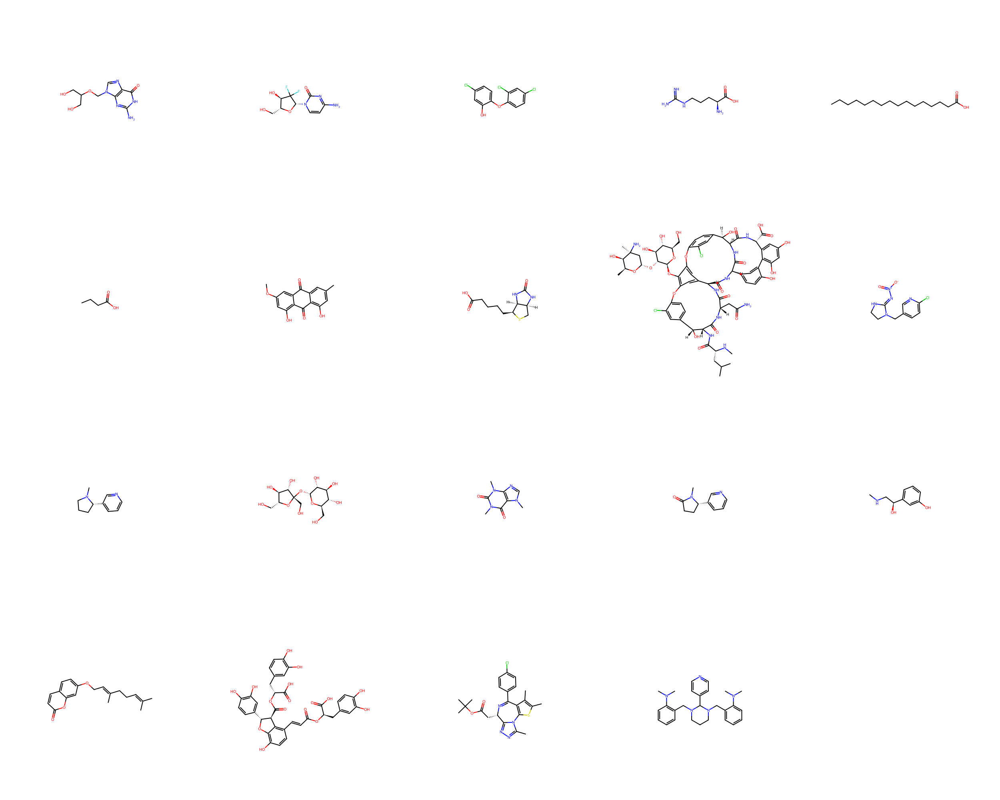

In [18]:
plot_smiles(users[0], 5)

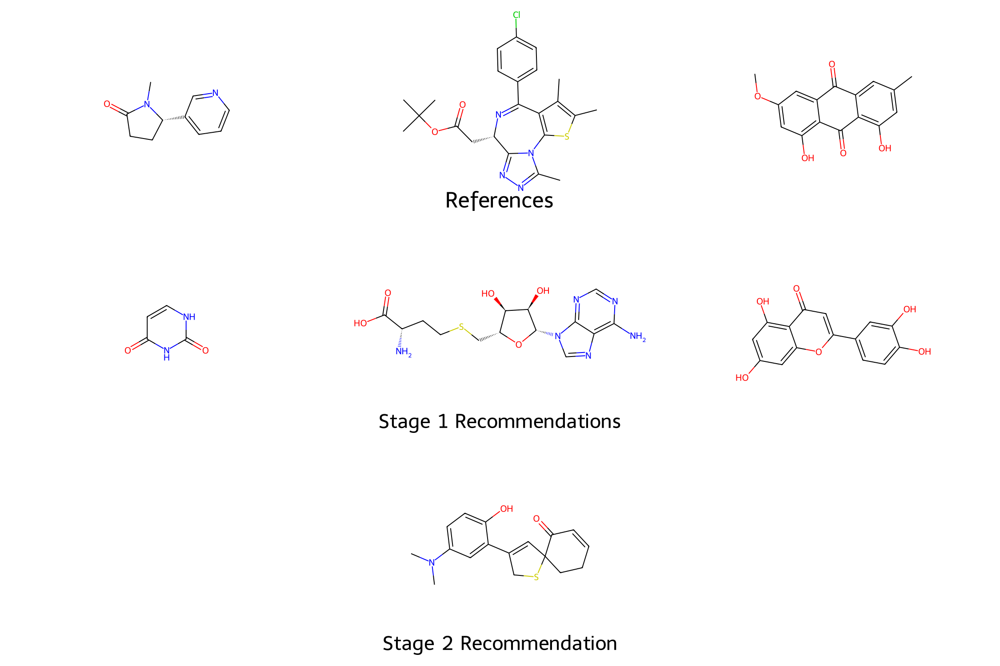

In [19]:
dims[3] = [750, 500]
visualize_e2e_recommendation(users[0], [13,17,6], dims[3])

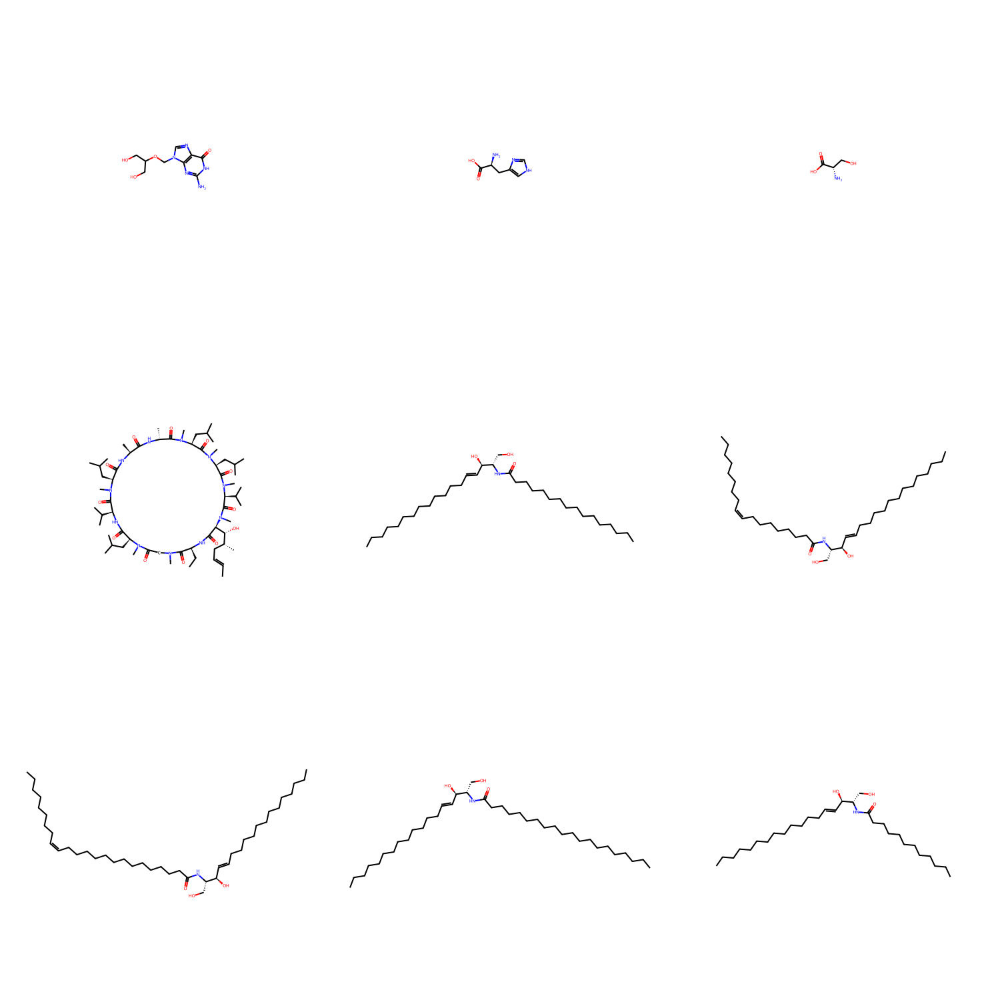

In [20]:
plot_smiles(users[1], 3)

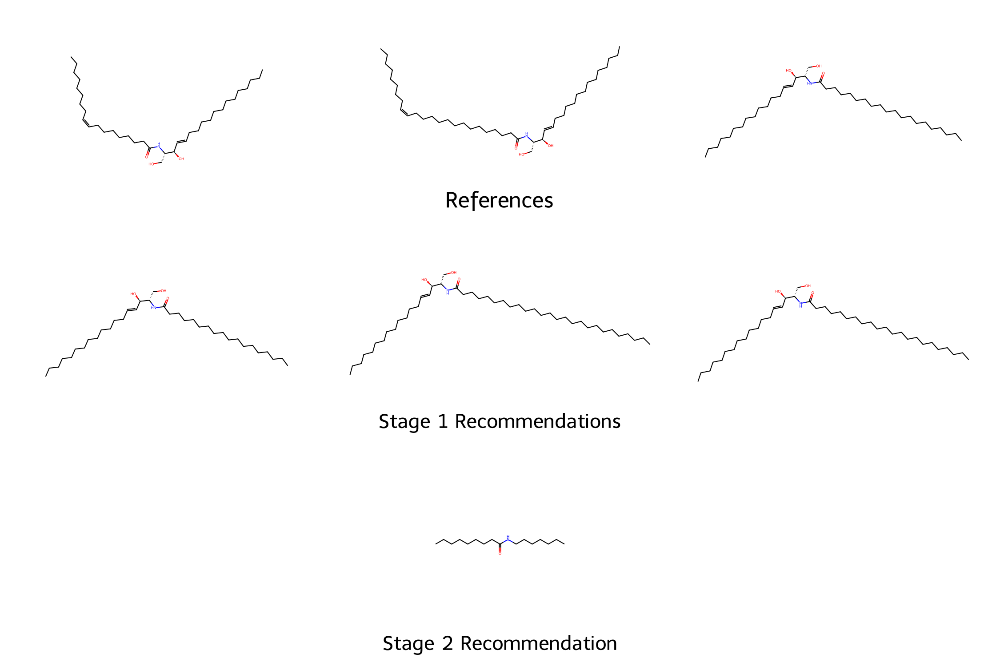

In [21]:
visualize_e2e_recommendation(users[1], [5,6,7], dims[3])

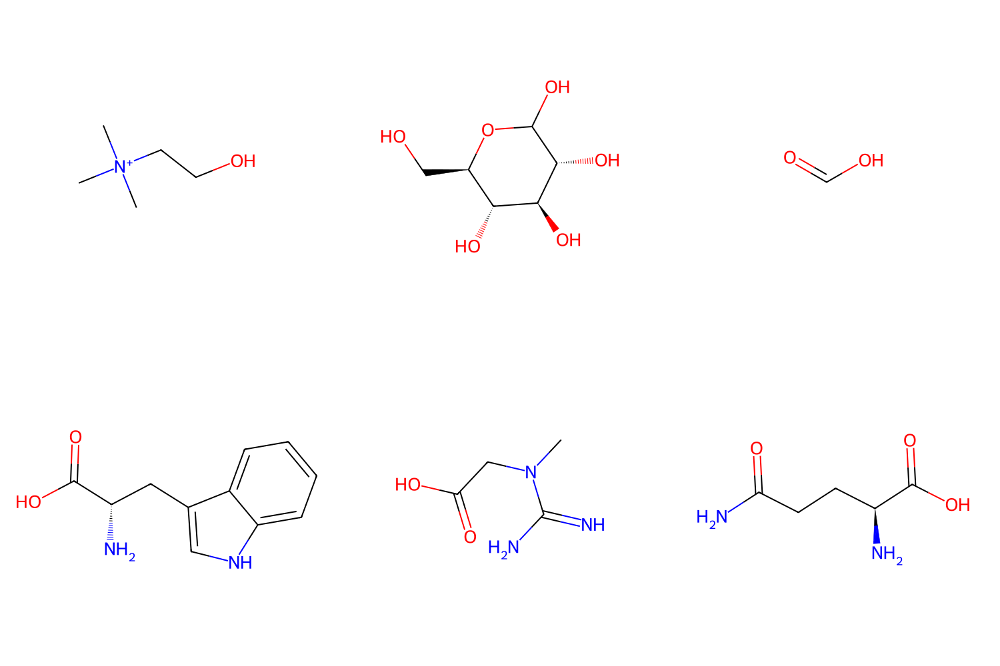

In [22]:
plot_smiles(users[2], 3)

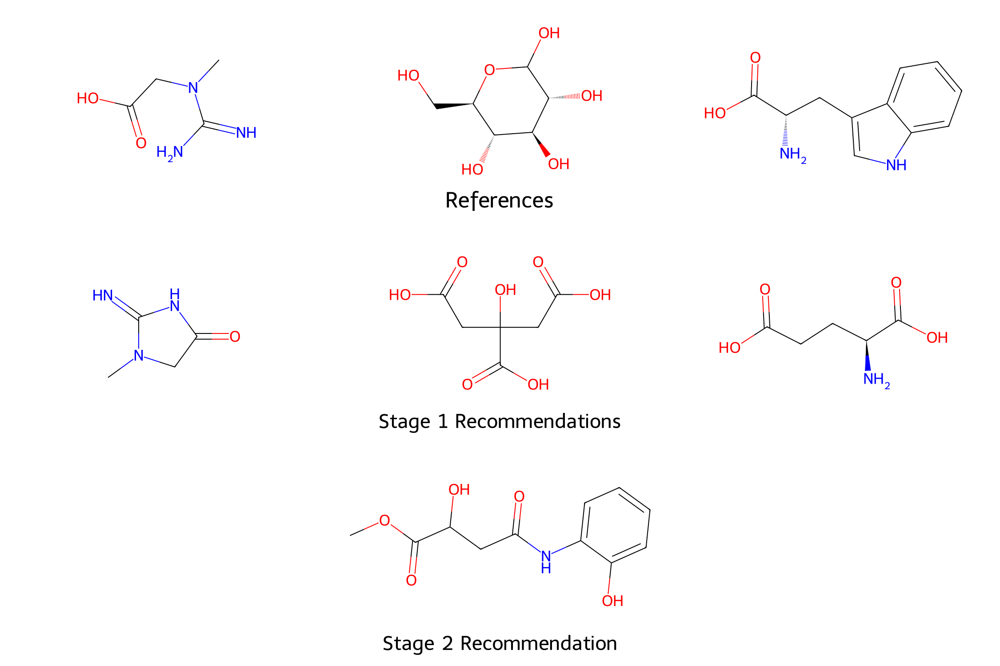

In [23]:
visualize_e2e_recommendation(users[2], [4,1,3], dims[3])

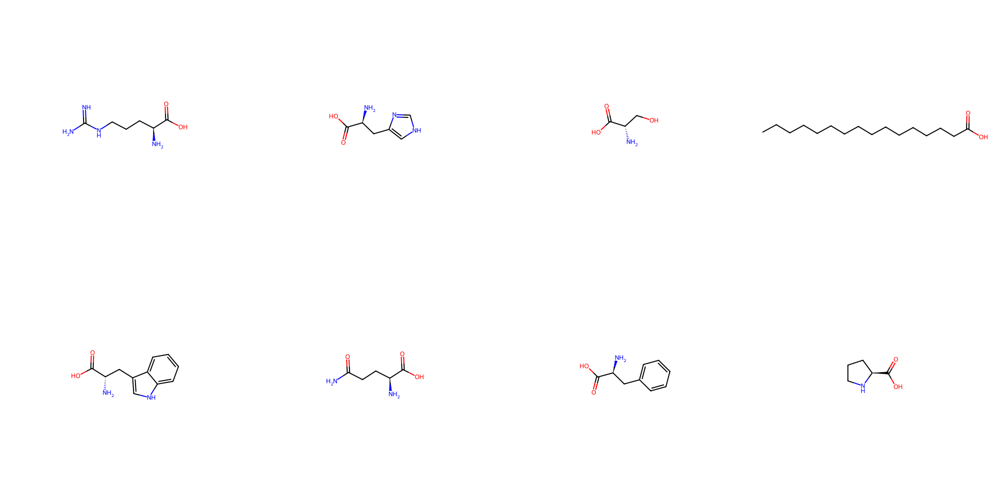

In [24]:
plot_smiles(users[3], 4)

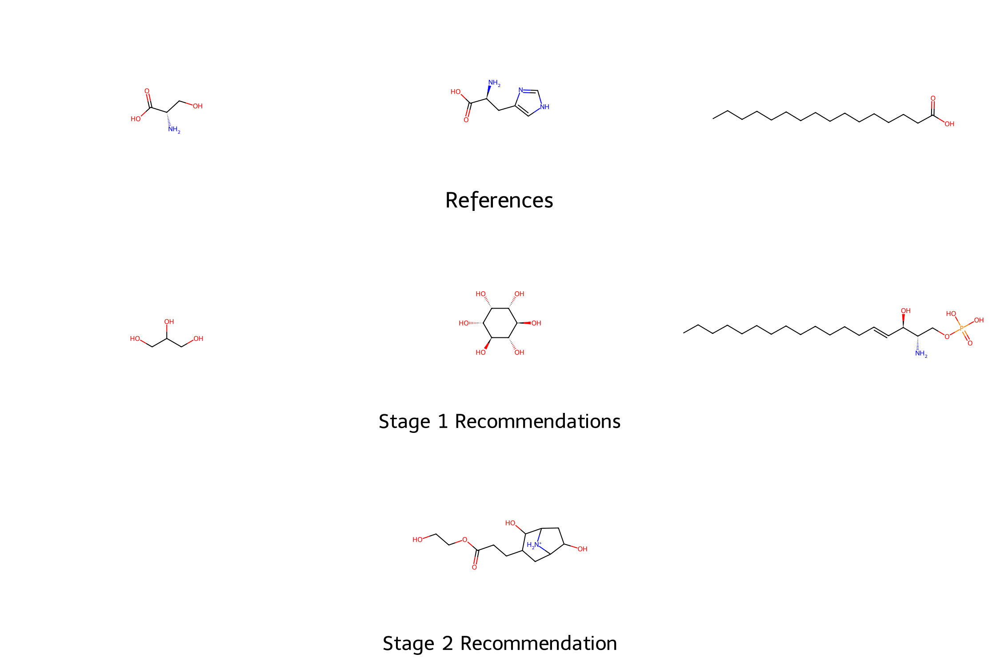

In [25]:
visualize_e2e_recommendation(users[3], [2,1,3], dims[3])

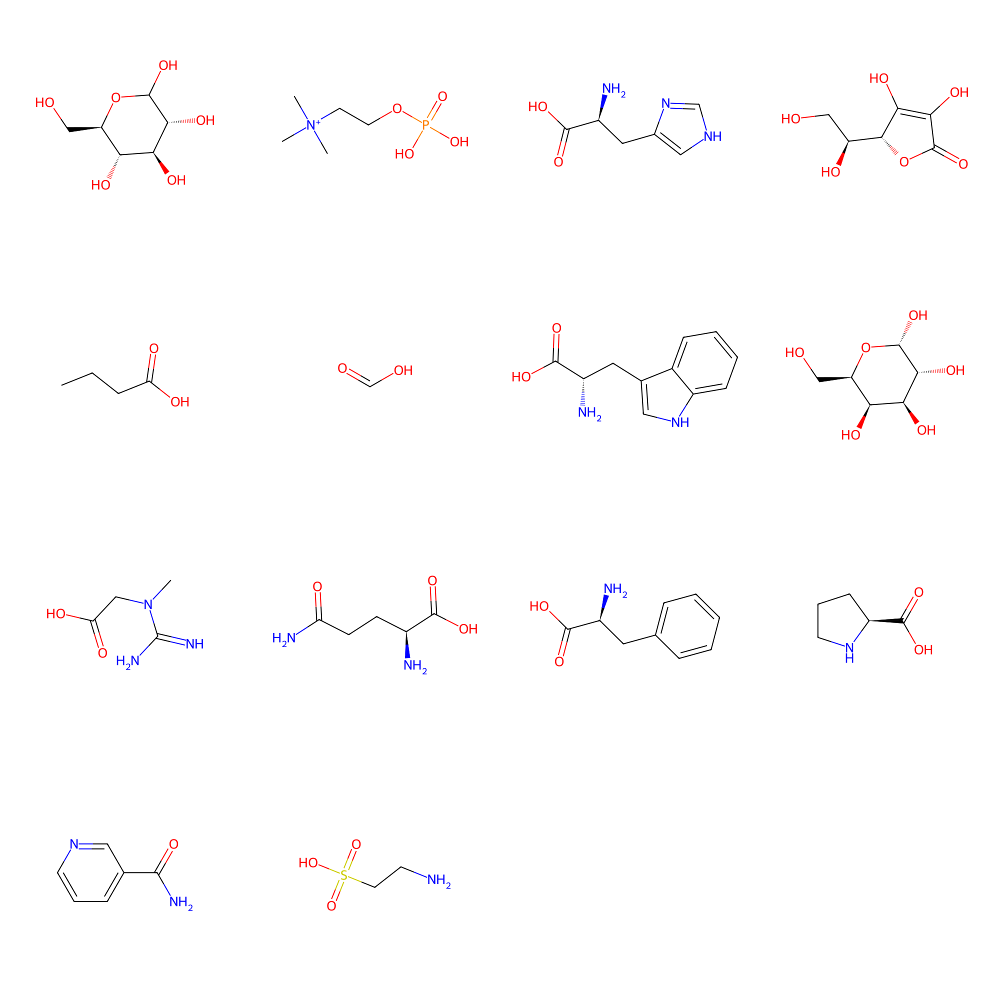

In [26]:
plot_smiles(users[4], 4)

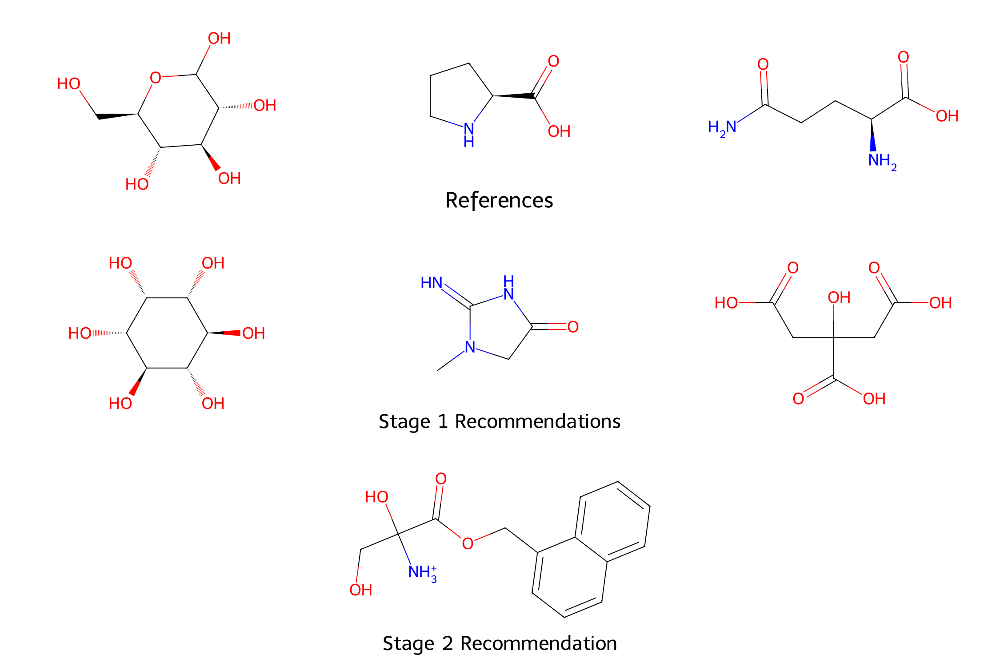

In [27]:
visualize_e2e_recommendation(users[4], [0,11,9], dims[3])

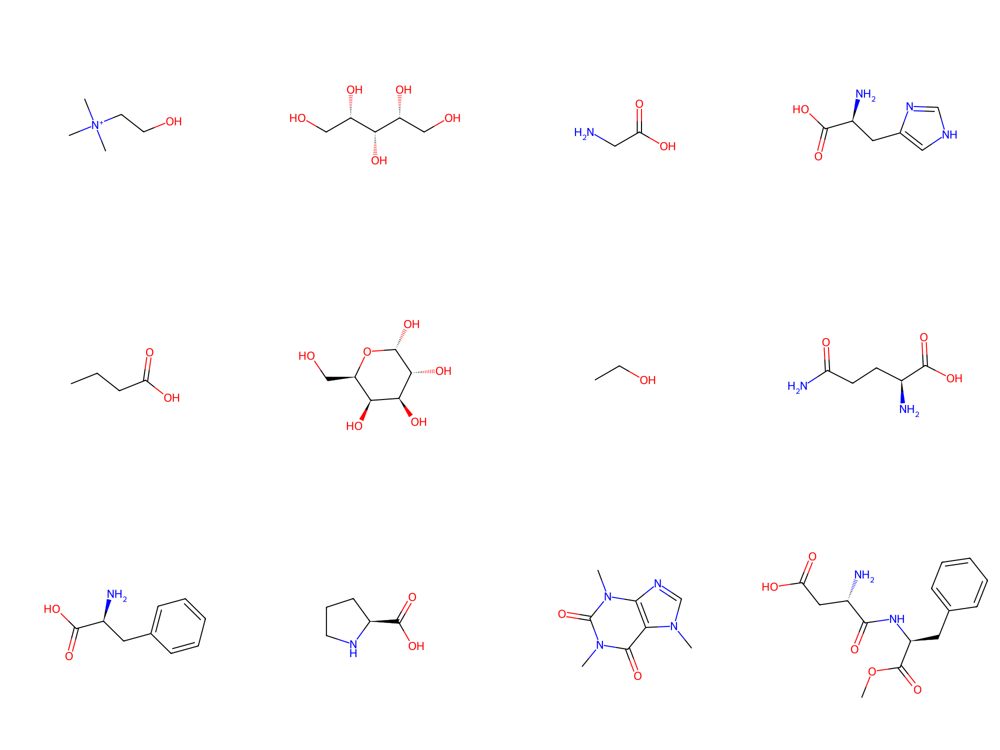

In [28]:
plot_smiles(users[5], 4)

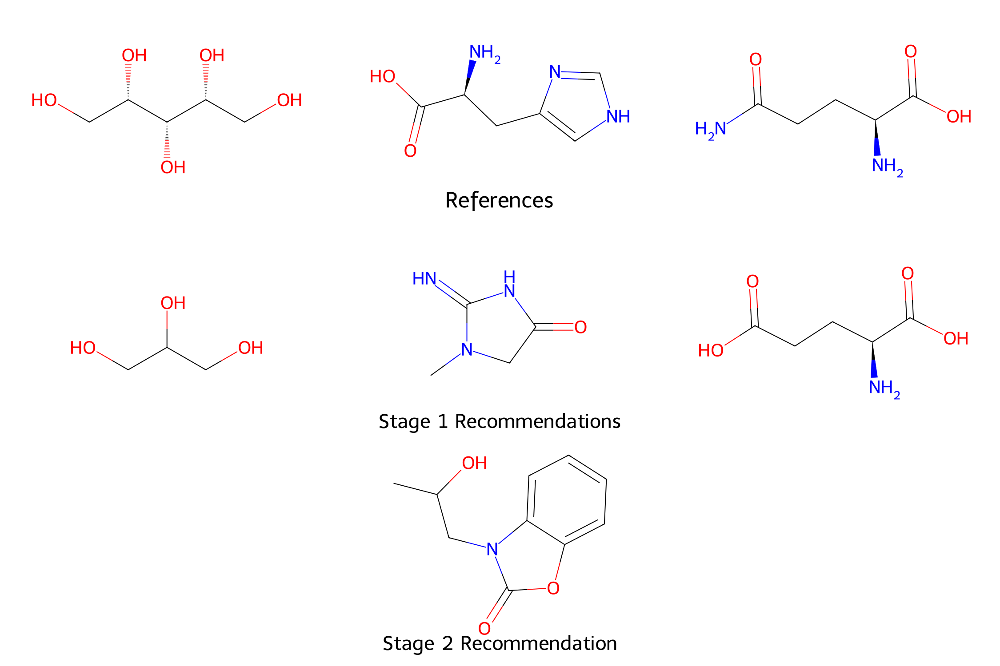

In [29]:
visualize_e2e_recommendation(users[5], [1,3,7], dims[3])

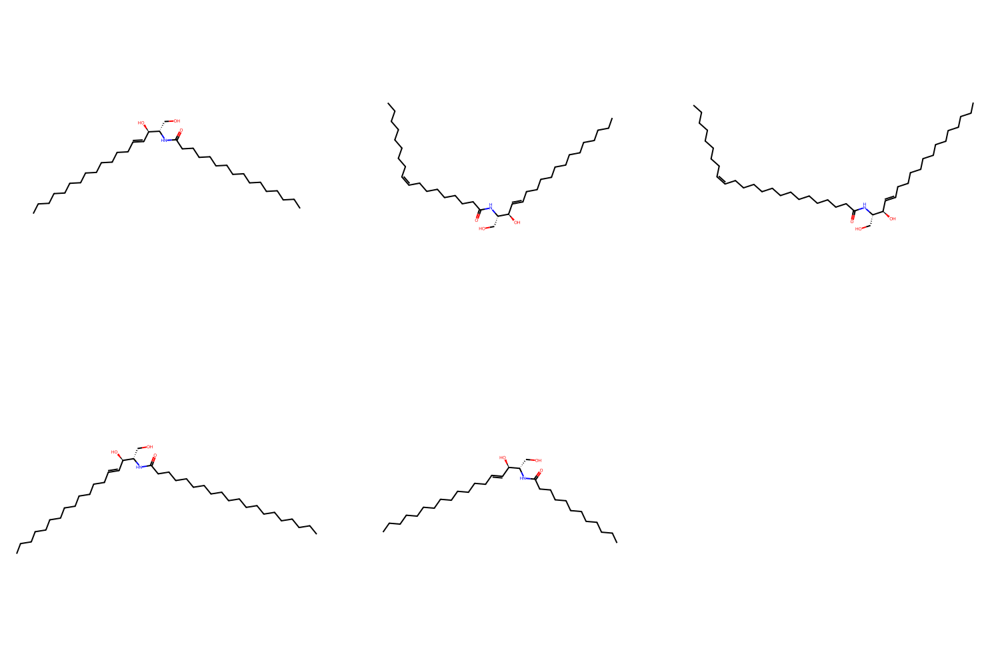

In [30]:
plot_smiles(users[6], 3)

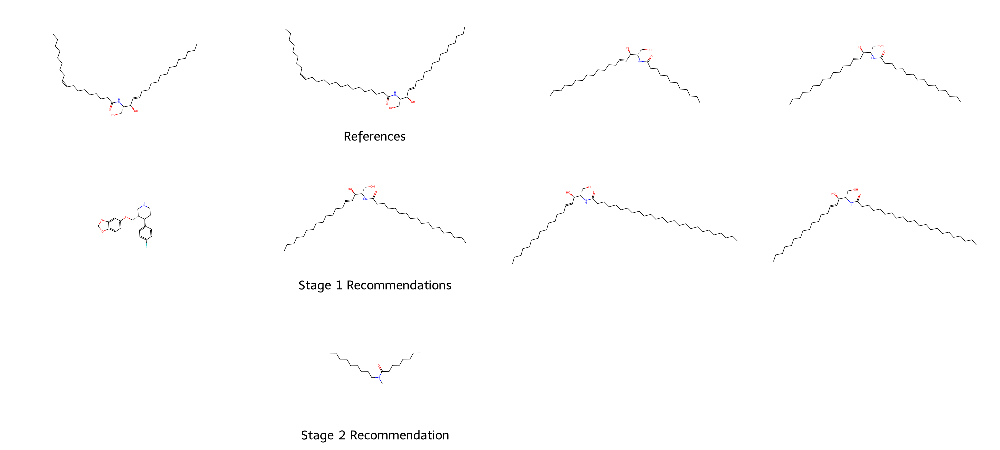

In [31]:
dims[4] = [1000, 600]
visualize_e2e_recommendation(users[6], [1,2,4,0], dims[4])

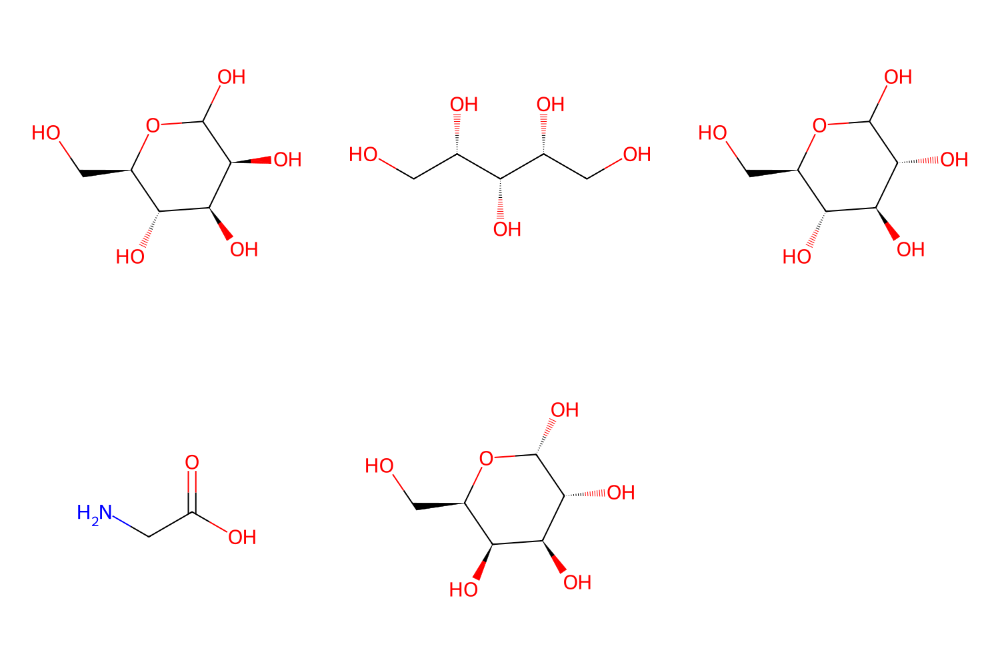

In [32]:
plot_smiles(users[7], 3)

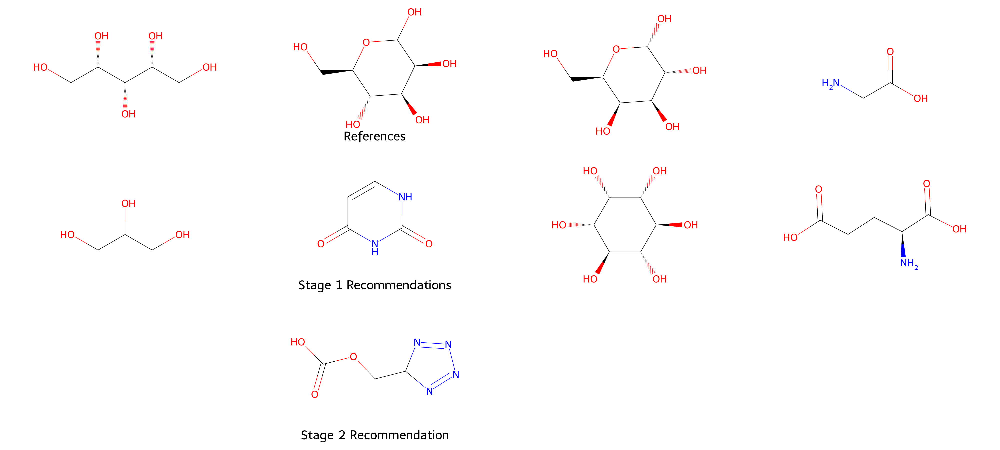

In [33]:
visualize_e2e_recommendation(users[7], [1,0,4,3], dims[4])

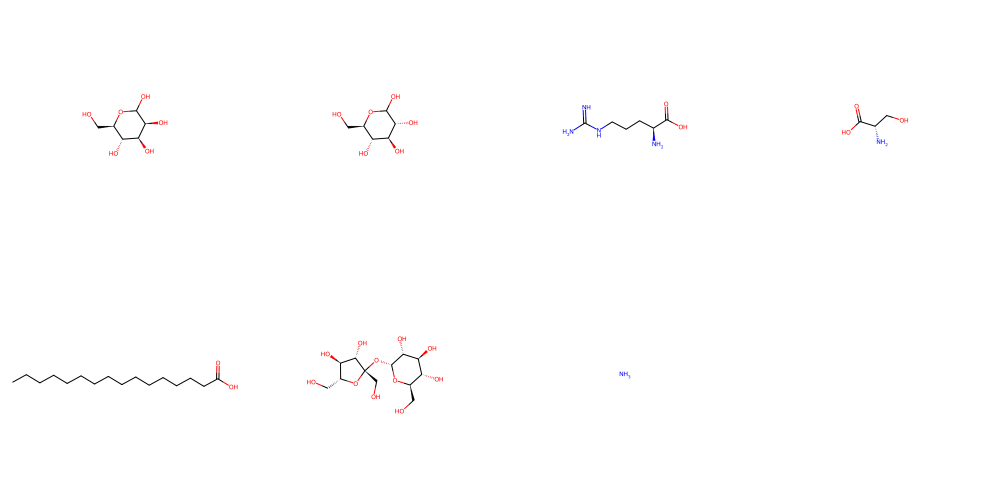

In [34]:
plot_smiles(users[8], 4)

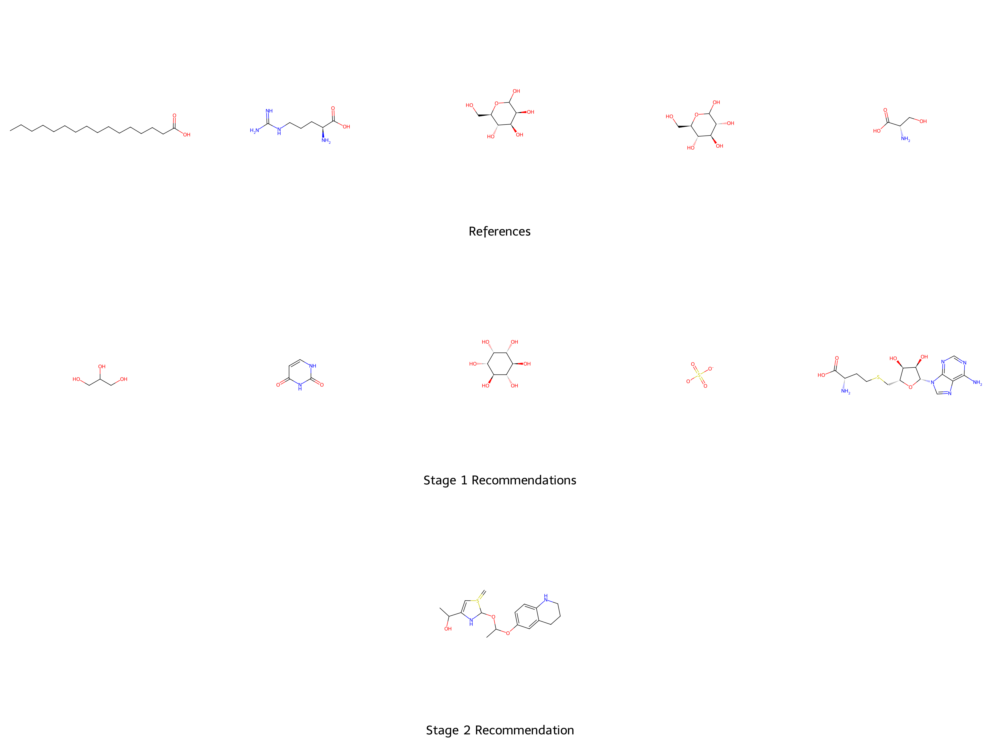

In [35]:
dims[5] = [800, 1000]
visualize_e2e_recommendation(users[8], [4, 2, 0, 1, 3], dims[5])

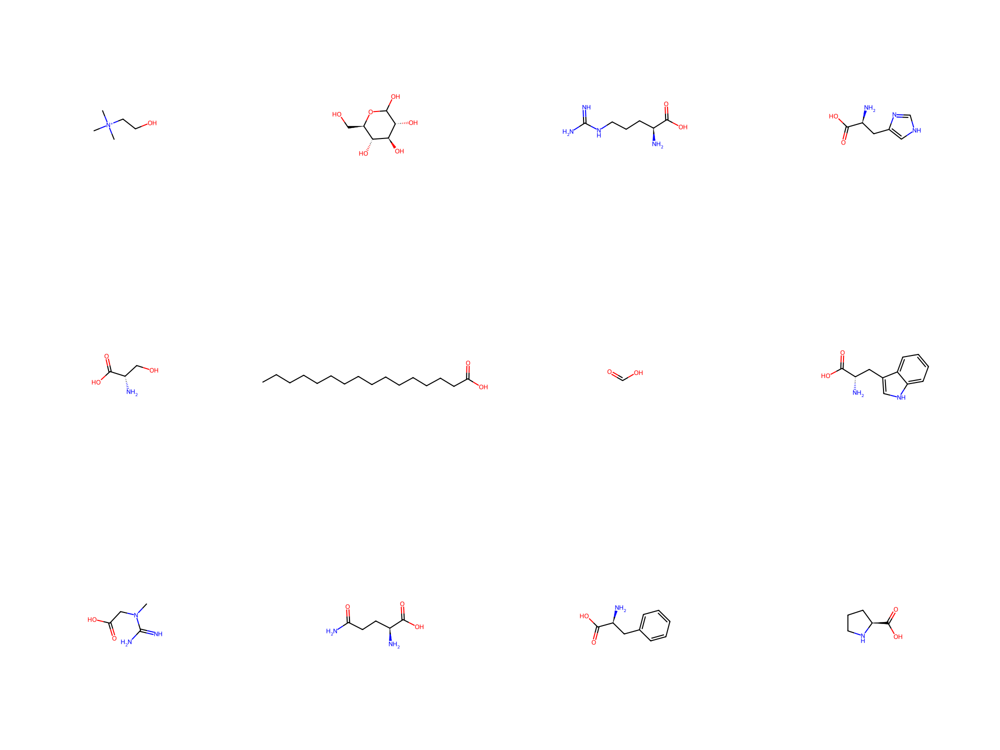

In [36]:
plot_smiles(users[9], 4)

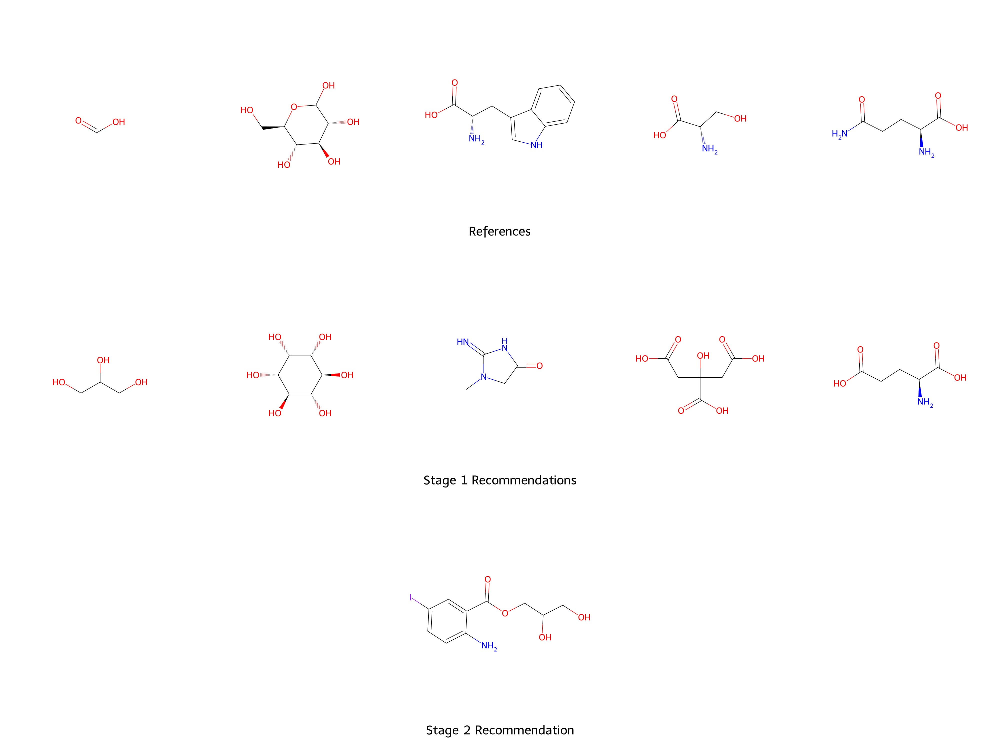

In [37]:
visualize_e2e_recommendation(users[9], [6, 1, 7, 4, 9], dims[5])

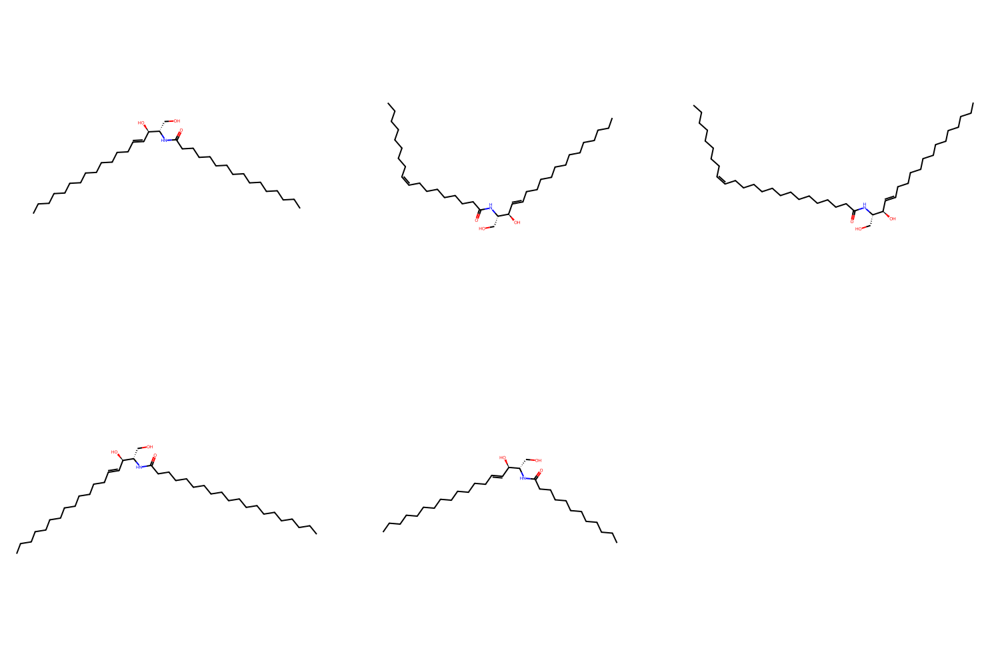

In [38]:
plot_smiles(users[10], 3)

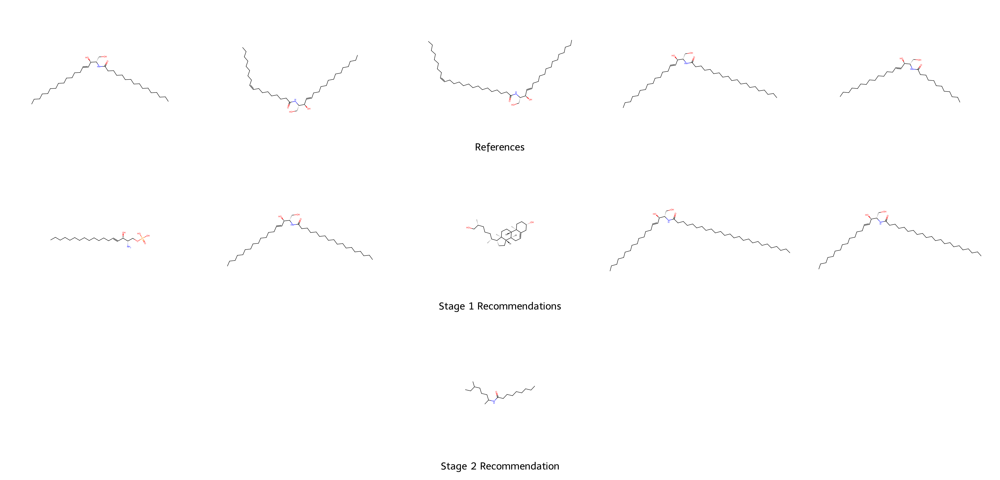

In [39]:
visualize_e2e_recommendation(users[10], None, [1000,800])

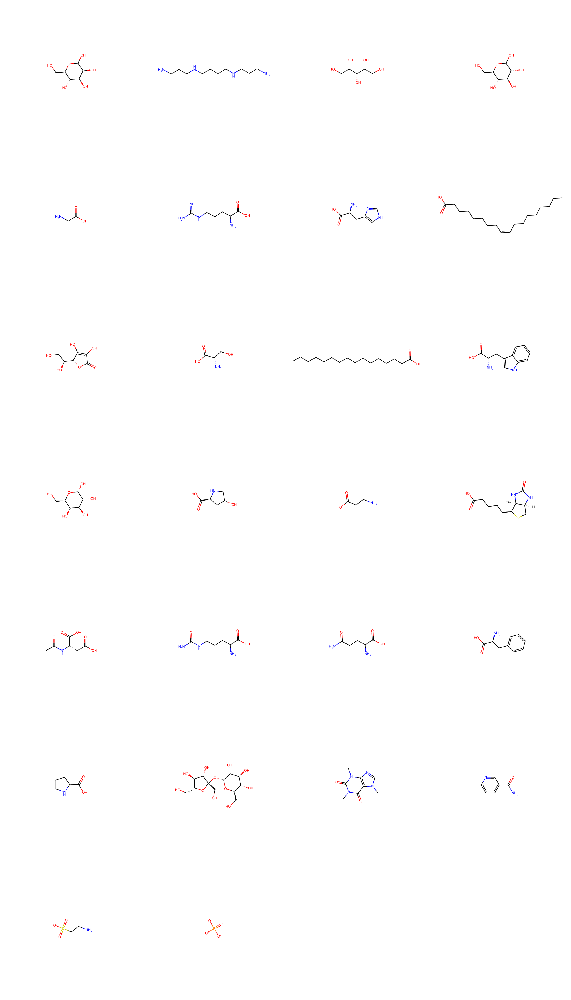

In [40]:
plot_smiles(users[11], 4)

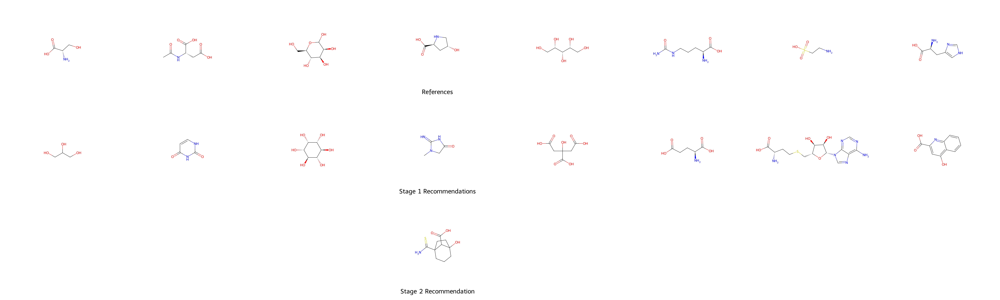

In [41]:
dims[8] = [1000, 800]
visualize_e2e_recommendation(users[11], [9,16,0,13,2,17,24,6], dims[8])